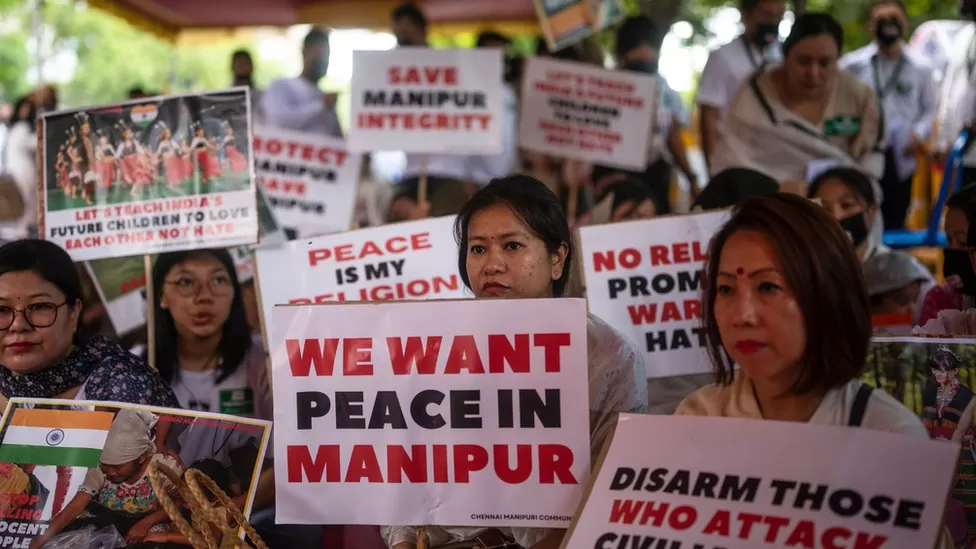

##                              Twitter Sentiment Analysis On- Manipur Issue

* The hilly north-east Indian state sits east of Bangladesh and borders Myanmar. It is home to an estimated 3.3 million people.More than half are Meiteis, while around 43% are Kukis and Nagas, the predominant minority tribes. 
At least 130 people have been killed and 400 wounded in violence that began in May. More than 60,000 have been forced from their homes as the army, paramilitary forces and police struggle to quell violence.Police armouries have been looted, hundreds of churches and more than a dozen temples ruined, and villages destroyed.*

### Importing relevant Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

from pandas_summary import DataFrameSummary
import sweetviz as sv
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.graph_objects as go
import re
import string
from tqdm.notebook import tqdm
from datetime import datetime
import dateutil.parser
import nltk
from spellchecker import SpellChecker
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
from wordcloud import WordCloud, ImageColorGenerator
from nltk.corpus import stopwords
import random 


### Reading Dataset

In [14]:
df=pd.read_csv(r'C:\Users\yamun\Desktop\DATA\FINAL_DATA.csv')

In [15]:
df

,Unnamed: 0,text,likes,timestamp
0,0,Narendra Modi..\nThe symbol of lies.\n\nIndia ...,214,08-08-2023
1,1,This video clarifies everything about how the ...,7,08-09-2023
2,2,"‘She is a minor, I am worried: Father of Dehra...",2429,08-08-2023
3,3,#Watch \nThe valley-based groups (Militants) a...,262,08-08-2023
4,4,Watch my press conference 👇. I have elaborated...,792,08-08-2023
...,...,...,...,...
2663,2996,🔴📢📢 Part 3 #WarOnDrugs #Consequence #BurningOf...,83,08-11-2023
2664,2997,Please raise up and support the War on Drugs \...,32,08-12-2023
2665,2998,Amit Shah's insights emphasize the #NRC's valu...,18,08-12-2023
2666,2999,"""It's high time for our political leaders, civ...",60,08-12-2023


In [16]:
df['text'][0]

"Narendra Modi..\nThe symbol of lies.\n\nIndia asks many questions about the economy, employment, and price rise. Women safety, dalits, Adani, and Manipur.\nModi never opened his mouth.\n\nBut to tell a lie and cheat the people, he opens it.\nThis is an example of it.\n\nModi doesn't even…"

### Preprocessing the data

In [10]:
df=df.drop(['Unnamed: 0'],axis=1)

In [103]:
df

,text,likes,timestamp,Language
0,narendra modi symbol lie india ask question ec...,214,08-08-2023,en
1,video clarifie minority live bjp rule india si...,7,08-09-2023,en
2,minor worried father dehraduni singer files co...,2429,08-08-2023,en
3,valleybase group militant wage war india past ...,262,08-08-2023,en
4,watch press conference elaborate extensively c...,792,08-08-2023,en
...,...,...,...,...
2663,part war drug bring disaster meitei community,83,08-11-2023,af
2664,raise support war drug,32,08-12-2023,fr
2665,amit shahs insight emphasize value preserve cu...,18,08-12-2023,en
2666,high time political leader civil society acade...,60,08-12-2023,en


## Text Cleaning Uisng NLTK Library

In [7]:
languages = stopwords.fileids()

print("Number of supported languages:", len(languages))

print("Supported languages:", languages)

Number of supported languages: 29
Supported languages: ['arabic', 'azerbaijani', 'basque', 'bengali', 'catalan', 'chinese', 'danish', 'dutch', 'english', 'finnish', 'french', 'german', 'greek', 'hebrew', 'hinglish', 'hungarian', 'indonesian', 'italian', 'kazakh', 'nepali', 'norwegian', 'portuguese', 'romanian', 'russian', 'slovene', 'spanish', 'swedish', 'tajik', 'turkish']


In [8]:
from nltk.tokenize import TweetTokenizer

In [10]:
english_stopwords = stopwords.words('english')
hinglish_stopwords = stopwords.words('hinglish')

In [11]:
print(english_stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### 1. Removing Special Characters ,Tokenizing the tweet ,Removing punctuations etc.

In [15]:


def clean_tweet(tweet):
    # Remove URLs, hashtags, mentions, and special characters
    tweet = re.sub(r"http\S+|www\S+|@\w+|#\w+", "", tweet)
    tweet = re.sub(r"[^\w\s]", "", tweet)

    # Tokenize the tweet
    tokenizer = TweetTokenizer(preserve_case=False, reduce_len=True, strip_handles=True)
    tokens = tokenizer.tokenize(tweet)

    # Remove stopwords for English and Hinglish
    tokens = [token for token in tokens if token not in english_stopwords and token not in hinglish_stopwords]

    # Remove punctuation and convert to lowercase
    tokens = [token.translate(str.maketrans('', '', string.punctuation)) for token in tokens]
    tokens = [token.lower() for token in tokens]

    # Join tokens back into a string
    cleaned_tweet = ' '.join(tokens)

    return cleaned_tweet


In [16]:
df['text'] = df['text'].apply(clean_tweet)

### 2.Text to lowercase

In [17]:
def clean_text(text):
    text = text.lower() 
    return text.strip()

In [18]:
df.text = df.text.apply(lambda x: clean_text(x))

In [19]:
def tokenization(text):
    tokens = re.split('W+',text)
    return tokens

In [20]:
df.text = df.text.apply(lambda x: tokenization(x))

In [21]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\yamun\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [22]:
import spacy
nlp = spacy.load("en_core_web_sm")

### 3.Lemmatizing the text

In [23]:


def lemmatizer(text):
    # Join the list of words into a string
    text = " ".join(text)
    
    # Apply lemmatization using spaCy
    doc = nlp(text)
    lemm_text = " ".join([token.lemma_ for token in doc])
    
    return lemm_text

In [24]:
df.text = df.text.apply(lemmatizer)

### 4.Removing Digits

In [25]:
def remove_digits(text):
    clean_text = re.sub(r"\b[0-9]+\b\s*", "", text)
    return(text)

In [26]:
df.text= df.text.apply(lambda x: remove_digits(x))

In [27]:
def remove_digits1(sample_text):
    clean_text = " ".join([w for w in sample_text.split() if not w.isdigit()]) 
    return(clean_text)

In [28]:

df.text = df.text.apply(lambda x: remove_digits1(x))

In [29]:
from langdetect import detect

def detect_language(text):
    try:
        lang = detect(text)
        return lang
    except:
        return None

df['Language'] = df['text'].apply(detect_language)

In [30]:
df

,text,likes,timestamp,Language
0,narendra modi symbol lie india ask question ec...,214,08-08-2023,en
1,video clarifie minority live bjp rule india si...,7,08-09-2023,en
2,minor worried father dehraduni singer files co...,2429,08-08-2023,en
3,valleybase group militant wage war india past ...,262,08-08-2023,en
4,watch press conference elaborate extensively c...,792,08-08-2023,en
...,...,...,...,...
2663,part war drug bring disaster meitei community,83,08-11-2023,af
2664,raise support war drug,32,08-12-2023,fr
2665,amit shahs insight emphasize value preserve cu...,18,08-12-2023,en
2666,high time political leader civil society acade...,60,08-12-2023,en


In [31]:
df['Language'].nunique()

39

In [32]:
df1 = df.copy()

In [33]:
df1 = df[df['Language'] != 'hi']

In [34]:
df1

,text,likes,timestamp,Language
0,narendra modi symbol lie india ask question ec...,214,08-08-2023,en
1,video clarifie minority live bjp rule india si...,7,08-09-2023,en
2,minor worried father dehraduni singer files co...,2429,08-08-2023,en
3,valleybase group militant wage war india past ...,262,08-08-2023,en
4,watch press conference elaborate extensively c...,792,08-08-2023,en
...,...,...,...,...
2663,part war drug bring disaster meitei community,83,08-11-2023,af
2664,raise support war drug,32,08-12-2023,fr
2665,amit shahs insight emphasize value preserve cu...,18,08-12-2023,en
2666,high time political leader civil society acade...,60,08-12-2023,en


In [35]:

spell = SpellChecker()

In [36]:

def label_sentiment(x:float):
    if x < -0.05 : return 'negative'
    if x > 0.35 : return 'positive'
    return 'neutral'


In [37]:
sia = SIA()

## Finding polarity of tweets

In [38]:
df1['sentiment'] = [sia.polarity_scores(x)['compound'] for x in tqdm(df1['text'])]
df1['overall_sentiment'] = df1['sentiment'].apply(label_sentiment);

  0%|          | 0/2341 [00:00<?, ?it/s]

In [39]:
average_sentiment =sum(df1['sentiment']) /len(df1['sentiment'])

In [40]:
print(average_sentiment)

-0.1223680905595898


In [85]:
df1.to_csv('CLEANED.csv')

In [42]:
positive_sentiment_df = df1[df1['overall_sentiment'] == 'positive']

In [43]:
positive_sentiment_df.to_csv('positive.csv')

In [44]:
negative_sentiment_df = df1[df1['overall_sentiment'] == 'negative']

In [45]:
negative_sentiment_df.to_csv('negative.csv')

In [46]:
neutral_sentiment_df = df1[df1['overall_sentiment'] == 'neutral']

In [47]:
neutral_sentiment_df.to_csv('neutral.csv')

In [48]:
positive_sentiment_df 

,text,likes,timestamp,Language,sentiment,overall_sentiment
14,confidence motion debate manipur awareness lev...,2352,08-08-2023,fr,0.5106,positive
18,unflinche confidence indian government break b...,2781,08-08-2023,en,0.5106,positive
25,meetei roam freely hand hand manipur police re...,7,08-08-2023,en,0.8519,positive
33,wow accountability roam freely openly arm loot...,538,08-08-2023,en,0.7579,positive
36,dr manmohan singh year ail parliament wheelcha...,5727,08-07-2023,en,0.5106,positive
...,...,...,...,...,...,...
2649,rally bengaluru freedom park illegal immigrati...,5,08-12-2023,en,0.8316,positive
2658,net evidence come show humanity meiteis help k...,78,08-12-2023,en,0.7184,positive
2661,amit shah call implement show government commi...,5,08-12-2023,en,0.8555,positive
2665,amit shahs insight emphasize value preserve cu...,18,08-12-2023,en,0.9136,positive


In [49]:
neutral_sentiment_df['text'][6]

'distribution land property early own meitei timely intervention assam rifle happen manipur kashmir manipuri hindus kashmiri pandit'

# Visualization of Sentiments of tweets

In [50]:

import plotly.express as px

In [51]:
label_data = df1['overall_sentiment'].value_counts()

fig = px.pie(label_data, values=label_data.values, names=label_data.index,
             color_discrete_sequence=['blue', 'red', 'green'],
             hole=0.4,
             labels={'label_data': 'Sentiment'},
             title='Sentiment Distribution')

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(legend=dict(orientation='h', yanchor='bottom', y=-0.2, xanchor='center', x=0.5),
                  font=dict(family='serif', size=15),
                  title_font=dict(family='serif', size=20))

fig.show()

In [52]:
plt.figure(figsize=(15, 5))
plt.subplot(131)
word_freq_positive.plot(20, title="Top 20 Positive Sentiment Words") plt.figure(figsize=(15, 5))
plt.subplot(132)
word_freq_negative.plot(20, title="Top 20 Negative Sentiment Words") plt.figure(figsize=(15, 5))
plt.subplot(133)
word_freq_neutral.plot(20, title="Top 20 Neutral Sentiment Words") plt.tight_layout()
plt.show()

SyntaxError: invalid syntax (467798925.py, line 3)

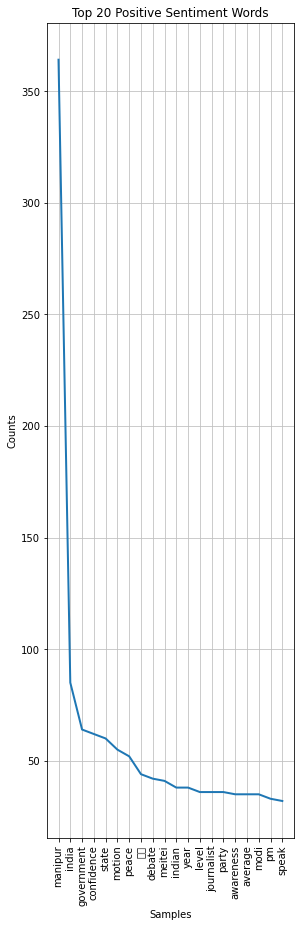

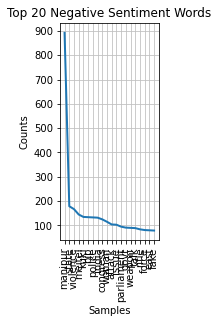

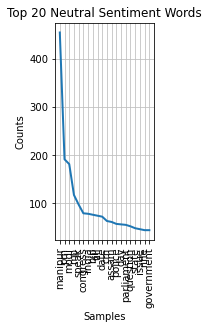

<Figure size 432x288 with 0 Axes>

In [53]:
import pandas as pd
from collections import Counter
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
import matplotlib.pyplot as plt

positive_texts = df1[df1['overall_sentiment'] == 'positive']['text']
negative_texts = df1[df1['overall_sentiment'] == 'negative']['text']
neutral_texts = df1[df1['overall_sentiment'] == 'neutral']['text']

def preprocess_text(text):
    words = word_tokenize(text.lower())  # Tokenize and convert to lowercase
    words = [word for word in words if word.isalpha()]  # Remove non-alphabetic tokens
    words = [word for word in words if word not in stopwords.words('english')]  # Remove stopwords
    return words

positive_words = [word for text in positive_texts for word in preprocess_text(text)]
negative_words = [word for text in negative_texts for word in preprocess_text(text)]
neutral_words = [word for text in neutral_texts for word in preprocess_text(text)]

positive_word_freq = FreqDist(positive_words)
negative_word_freq = FreqDist(negative_words)
neutral_word_freq = FreqDist(neutral_words)
plt.figure(figsize=(15, 15))

plt.subplot(131)
positive_word_freq.plot(20, title="Top 20 Positive Sentiment Words")

plt.subplot(132)
negative_word_freq.plot(20, title="Top 20 Negative Sentiment Words")

plt.subplot(133)
neutral_word_freq.plot(20, title="Top 20 Neutral Sentiment Words")

plt.tight_layout()
plt.show()


In [54]:
df1

,text,likes,timestamp,Language,sentiment,overall_sentiment
0,narendra modi symbol lie india ask question ec...,214,08-08-2023,en,-0.0516,negative
1,video clarifie minority live bjp rule india si...,7,08-09-2023,en,-0.7964,negative
2,minor worried father dehraduni singer files co...,2429,08-08-2023,en,-0.7579,negative
3,valleybase group militant wage war india past ...,262,08-08-2023,en,-0.8625,negative
4,watch press conference elaborate extensively c...,792,08-08-2023,en,-0.6369,negative
...,...,...,...,...,...,...
2663,part war drug bring disaster meitei community,83,08-11-2023,af,-0.8402,negative
2664,raise support war drug,32,08-12-2023,fr,-0.2960,negative
2665,amit shahs insight emphasize value preserve cu...,18,08-12-2023,en,0.9136,positive
2666,high time political leader civil society acade...,60,08-12-2023,en,0.8934,positive


### splitiing the dataset into X and Y

In [55]:
x = df1['text']
y = df1['overall_sentiment']

print(len(x), len(y))



2341 2341


### SPLITIING INTO TRAIN  TEST SETS

In [56]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42)
print(len(x_train), len(y_train))
print(len(x_test), len(y_test))



1755 1755
586 586


In [57]:
y_train

78      negative
69      positive
824     positive
2610     neutral
894      neutral
          ...   
1782    positive
1174    negative
1210     neutral
1382    negative
923      neutral
Name: overall_sentiment, Length: 1755, dtype: object

In [58]:
unique_elements = np.unique(y_train)
num_unique_elements = unique_elements.size

print("Unique elements in y_train:", unique_elements)
print("Number of unique elements:", num_unique_elements)

Unique elements in y_train: ['negative' 'neutral' 'positive']
Number of unique elements: 3


### VECTORIZING THE TWEETS

In [59]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer()
vect.fit(x_train)

CountVectorizer()

In [60]:
x_train_dtm = vect.transform(x_train)
x_test_dtm = vect.transform(x_test)

In [61]:
x_test_dtm

<586x4576 sparse matrix of type '<class 'numpy.int64'>'
	with 7223 stored elements in Compressed Sparse Row format>

In [62]:
vect_tunned = CountVectorizer(stop_words='english', ngram_range=(1,2), min_df=0.1, max_df=0.7, max_features=100)

### Document-Term Matrix (DTM) into a Term Frequency-Inverse Document Frequency (TF-IDF) 

In [63]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()

tfidf_transformer.fit(x_train_dtm)
x_train_tfidf = tfidf_transformer.transform(x_train_dtm)

x_train_tfidf

<1755x4576 sparse matrix of type '<class 'numpy.float64'>'
	with 24172 stored elements in Compressed Sparse Row format>

In [64]:
texts = df1['text']
target = df1['overall_sentiment']

In [65]:
from keras.preprocessing.text import Tokenizer

In [66]:
word_tokenizer = Tokenizer()
word_tokenizer.fit_on_texts(texts)

vocab_length = len(word_tokenizer.word_index) + 1
vocab_length

5405

In [67]:
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from nltk.tokenize import word_tokenize

In [68]:
def embed(corpus): 
    return word_tokenizer.texts_to_sequences(corpus)

longest_train = max(texts, key=lambda sentence: len(word_tokenize(sentence)))
length_long_sentence = len(word_tokenize(longest_train))

train_padded_sentences = pad_sequences(
    embed(texts), 
    length_long_sentence, 
    padding='post'
)

train_padded_sentences

array([[ 307,    3, 1348, ...,    0,    0,    0],
       [  31, 1937,  152, ...,    0,    0,    0],
       [ 124,  130,   86, ...,    0,    0,    0],
       ...,
       [ 116, 2725, 1192, ...,    0,    0,    0],
       [ 264,   79,  145, ...,    0,    0,    0],
       [ 387,  255,  215, ...,    0,    0,    0]])

In [69]:
import numpy as np

### USING MULTINOMIAL NAIVE BAYES FOR TEXT CLASSIFICATION

In [70]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()

# Train the model
nb.fit(x_train_dtm, y_train)

MultinomialNB()

In [71]:
y_pred_class = nb.predict(x_test_dtm)
y_pred_prob = nb.predict_proba(x_test_dtm)[:, 1]

In [72]:

from sklearn import metrics
print(metrics.accuracy_score(y_test, y_pred_class))



0.7610921501706485


In [73]:


from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline

pipe = Pipeline([('bow', CountVectorizer()), 
                 ('tfid', TfidfTransformer()),  
                 ('model', MultinomialNB())])



In [74]:
pipe.fit(x_train, y_train)

y_pred_class = pipe.predict(x_test)

print(metrics.accuracy_score(y_test, y_pred_class))

0.7218430034129693


### lABEL ENCODING THE TARGET OR SENTIMENT

In [75]:

from sklearn.preprocessing import LabelEncoder



In [76]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)

In [77]:


X_train, X_test, y_train, y_test = train_test_split(x, y_encoded, test_size=0.2, random_state=42)



### using pipeline for xg-boost classifier

In [78]:


import xgboost as xgb

pipe = Pipeline([
    ('bow', CountVectorizer()), 
    ('tfid', TfidfTransformer()),  
    ('model', xgb.XGBClassifier(
        learning_rate=0.1,
        max_depth=7,
        n_estimators=80,
        use_label_encoder=False,
        eval_metric='auc',
    ))
])



In [79]:


pipe.fit(X_train, y_train)



Pipeline(steps=[('bow', CountVectorizer()), ('tfid', TfidfTransformer()),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='auc',
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=Non

In [80]:


y_pred = pipe.predict(X_test)



In [81]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, y_pred)
print('Test accuracy:', acc)

Test accuracy: 0.8166311300639659


In [82]:
y_test

array([1, 2, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 2, 1, 0, 1, 0, 0, 2, 0, 0,
       1, 1, 0, 0, 0, 2, 2, 0, 2, 1, 1, 2, 0, 0, 2, 2, 0, 0, 2, 1, 1, 1,
       0, 2, 0, 0, 0, 2, 0, 2, 2, 1, 2, 0, 0, 1, 2, 1, 1, 1, 1, 0, 0, 1,
       0, 2, 1, 0, 1, 0, 0, 2, 0, 2, 2, 1, 1, 1, 2, 0, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 2, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 2, 1, 1,
       0, 2, 1, 1, 1, 0, 0, 2, 0, 1, 1, 1, 1, 0, 2, 0, 2, 0, 0, 1, 1, 0,
       0, 1, 1, 2, 1, 1, 0, 2, 0, 0, 0, 2, 0, 0, 1, 2, 2, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 2, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0,
       0, 2, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 2, 0, 0, 1, 1, 0, 0, 2, 0, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 2, 1, 0, 0, 2, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       2, 0, 0, 1, 0, 2, 1, 1, 2, 0, 2, 1, 2, 1, 1, 1, 0, 0, 1, 2, 2, 0,
       0, 2, 1, 0, 1, 1, 1, 1, 0, 2, 2, 0, 2, 0, 0, 0, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 2, 0,

In [83]:
y_pred

array([1, 2, 0, 0, 1, 0, 1, 1, 0, 2, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 2, 1,
       1, 1, 0, 0, 0, 2, 2, 0, 2, 1, 1, 1, 0, 0, 2, 2, 0, 0, 2, 1, 1, 1,
       0, 2, 0, 1, 0, 1, 0, 2, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 2, 2, 0, 1, 1, 2, 1, 0, 0, 2, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 0, 2, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       1, 2, 2, 1, 1, 0, 0, 2, 0, 1, 1, 1, 1, 0, 2, 0, 2, 0, 0, 1, 1, 0,
       0, 1, 1, 2, 1, 1, 1, 2, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 2, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0,
       0, 2, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 2, 1, 0, 1, 1, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 2, 1, 1, 2, 0, 0, 1, 2, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 2, 1, 0, 1, 1, 1, 1, 0, 2, 2, 1, 2, 0, 2, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 2, 0,

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

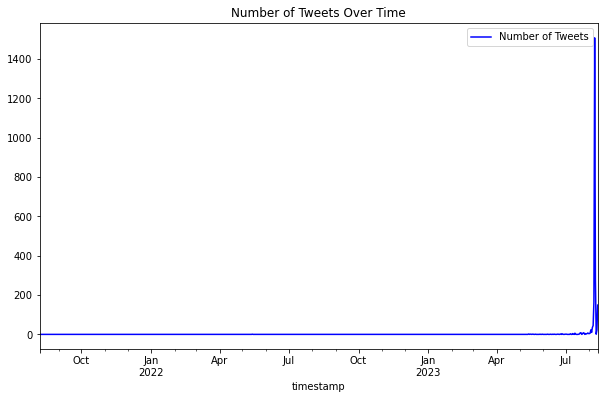

In [86]:
# Time Series Analysis
df1['timestamp'] = pd.to_datetime(df1['timestamp'])
df1.set_index('timestamp', inplace=True)
plt.figure(figsize=(10, 6))
df1.resample('D').size().plot(label='Number of Tweets', color='blue')
plt.title('Number of Tweets Over Time')
plt.legend()
plt.show()


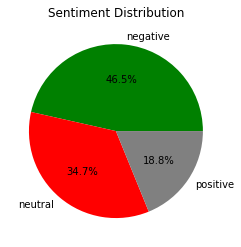

In [88]:
# Sentiment Distribution
sentiment_counts = df1['overall_sentiment'].value_counts()
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=['green', 'red', 'gray'])
plt.title('Sentiment Distribution')
plt.show()

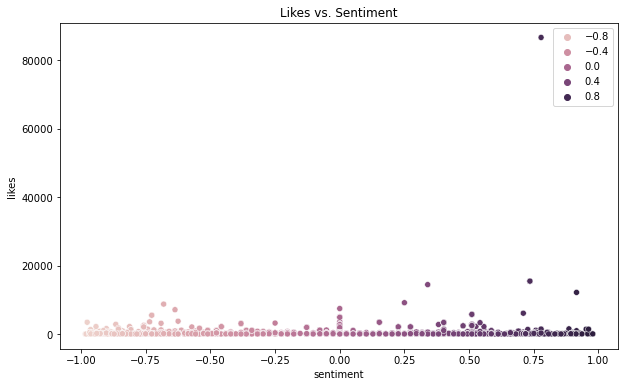

In [90]:
# Likes vs. Sentiment
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df1, x='sentiment', y='likes', hue='sentiment')
plt.title('Likes vs. Sentiment')
plt.legend()
plt.show()

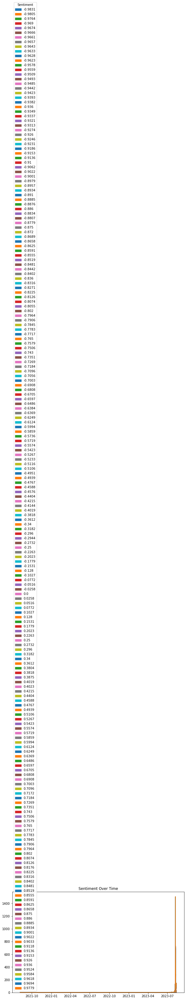

In [92]:
# Sentiment Over Time
sentiment_over_time = df1.groupby([df1.index.date, 'sentiment']).size().unstack()
sentiment_over_time.plot(kind='area', stacked=True, figsize=(10, 6))
plt.title('Sentiment Over Time')
plt.legend(title='Sentiment')
plt.show()


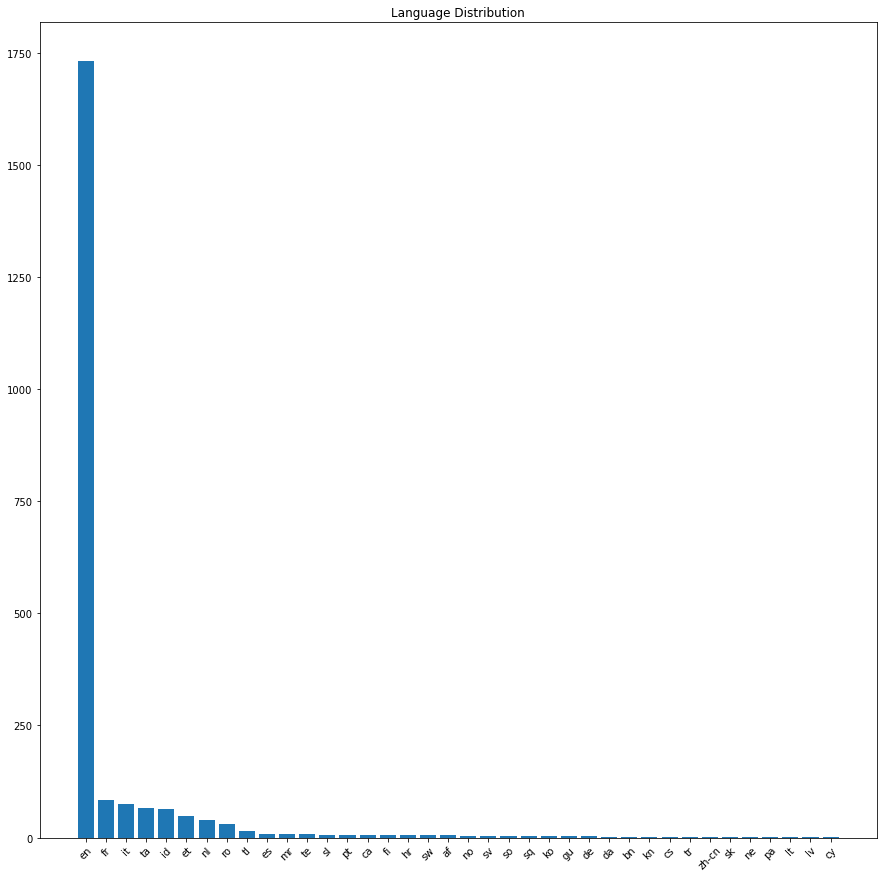

In [95]:
# Language Distribution
plt.figure(figsize=(15, 15))
language_counts = df1['Language'].value_counts()
plt.bar(language_counts.index, language_counts)
plt.xticks(rotation=45)
plt.title('Language Distribution')

plt.show()


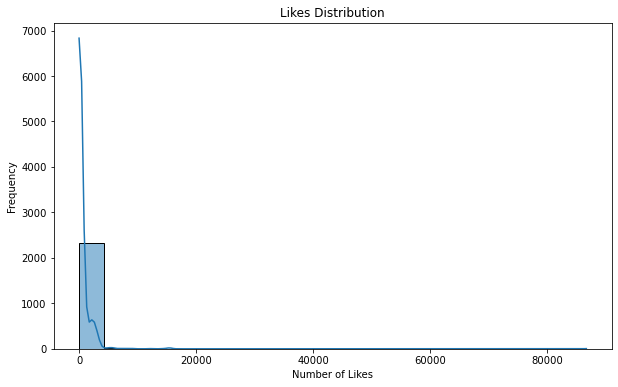

In [96]:
# Likes Distribution
plt.figure(figsize=(10, 6))
sns.histplot(df1['likes'], bins=20, kde=True)
plt.title('Likes Distribution')
plt.xlabel('Number of Likes')
plt.ylabel('Frequency')
plt.show()


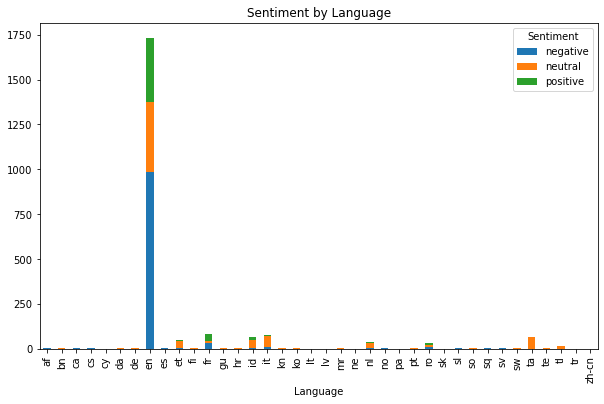

In [98]:

# Sentiment by Language
sentiment_by_language = df1.groupby(['Language', 'overall_sentiment']).size().unstack()
sentiment_by_language.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Sentiment by Language')
plt.legend(title='Sentiment')
plt.show()

In [ ]:
data = df['text'].astype(str)

### WORDCLOUD OF WHOLE DATA

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800, collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()


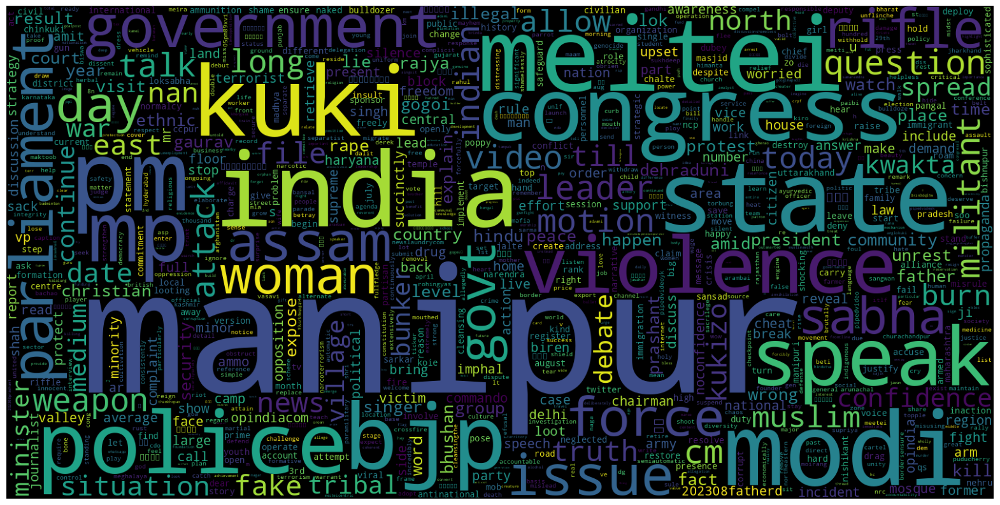

 ### 1.WORDCLOUD FOR WORDS WITH POSITIVE SENTIMENTS

In [ ]:
data = df[df['overall_sentiment']=="positive"]['text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

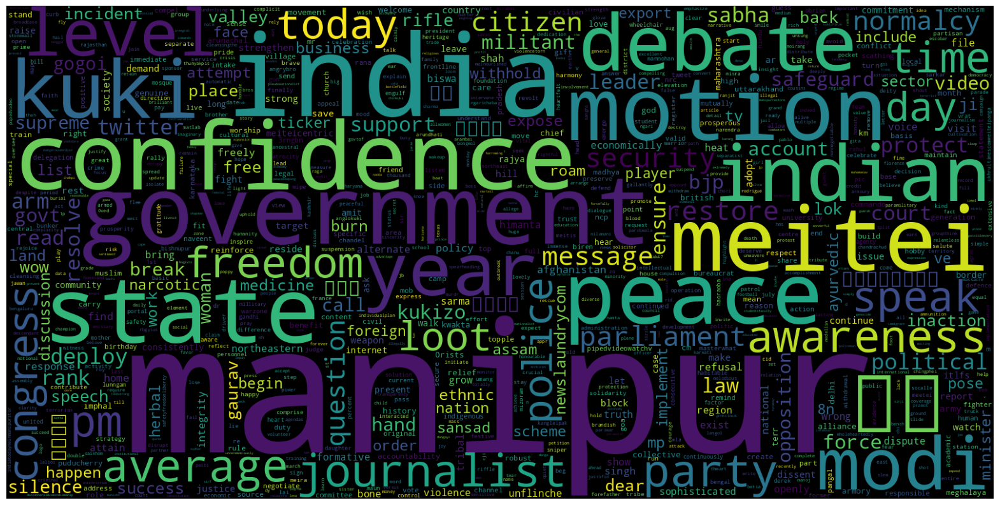

### 2. WORDCLOUD FOR WORDS WITH NEGATIVE SENTIMENTS

In [ ]:
data = df[df['overall_sentiment']=="negative"]['text']
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()

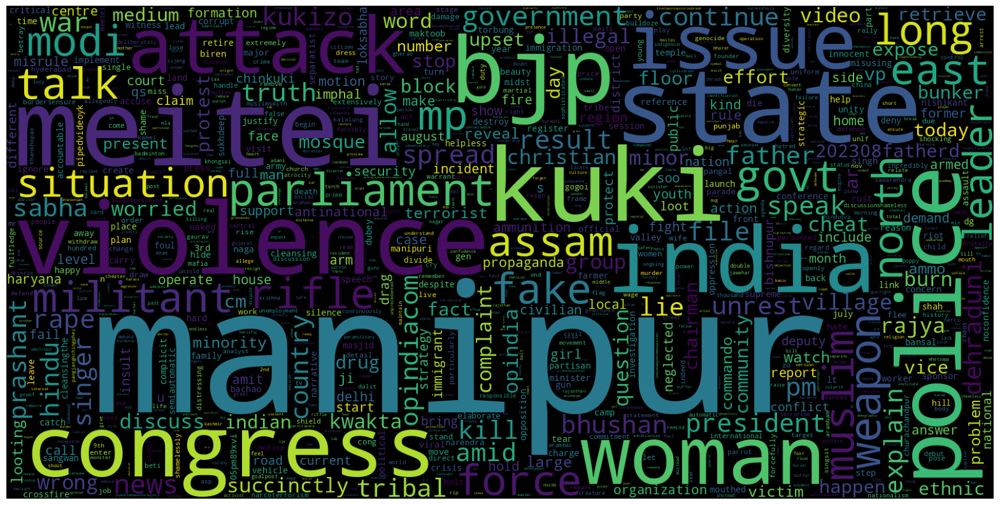

### 3.WORDCLOUD FOR WORDS WITH NEUTRAL SENTIMENTS

In [ ]:
data = df[df['overall_sentiment'] == "neutral"]['text']

# Convert non-string values to strings
data = [str(item) for item in data]

plt.figure(figsize=(20, 20))
wc = WordCloud(max_words=1000, width=1600, height=800, collocations=False).generate(" ".join(data))
plt.imshow(wc)
plt.axis('off')
plt.show()


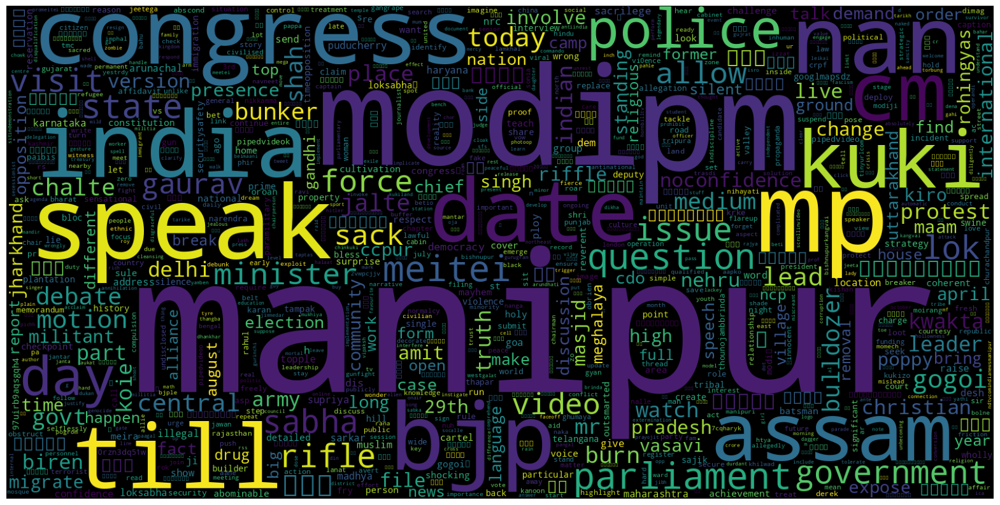

## Topic modeling using Latent Dirichlet Allocation (LDA)

In [105]:
import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel

In [111]:
documents = [doc.split() for doc in df1['text']]

In [112]:
documents

[['narendra',
  'modi',
  'symbol',
  'lie',
  'india',
  'ask',
  'question',
  'economy',
  'employment',
  'price',
  'rise',
  'woman',
  'safety',
  'dalit',
  'adani',
  'manipur',
  'modi',
  'open',
  'mouth',
  'lie',
  'cheat',
  'open',
  'modi'],
 ['video',
  'clarifie',
  'minority',
  'live',
  'bjp',
  'rule',
  'india',
  'situation',
  'grim',
  'take',
  'shape',
  'civil',
  'war',
  'openly',
  'listen',
  'carefully',
  'muslim',
  'live'],
 ['minor',
  'worried',
  'father',
  'dehraduni',
  'singer',
  'files',
  'complaint',
  'prashant',
  'bhushan',
  'spread',
  'fake',
  'news',
  'amid',
  'manipur',
  'unrest',
  'talk',
  'opindia',
  'opindiacom',
  '202308fatherd'],
 ['valleybase',
  'group',
  'militant',
  'wage',
  'war',
  'india',
  'past',
  'year',
  'major',
  'amit',
  'bansal',
  'geopolitic',
  'geostrategic',
  'expert',
  'real',
  'terrorist',
  'group',
  'manipur',
  'antinational',
  'group',
  'video',
  'mention'],
 ['watch',
  'press

In [113]:
dictionary = corpora.Dictionary(documents)

In [114]:
dictionary 

In [115]:
corpus = [dictionary.doc2bow(doc) for doc in documents]

In [117]:
num_topics = 20
lda_model = LdaModel(corpus, id2word=dictionary, num_topics=num_topics,passes=20)
for topic_id, topic_words in lda_model.print_topics(num_topics=num_topics):
    print(f"Topic {topic_id}: {topic_words}")

Topic 0: 0.063*"manipur" + 0.024*"violence" + 0.016*"narcoterrorism" + 0.016*"reside" + 0.015*"mechanism" + 0.013*"drug" + 0.013*"meitei" + 0.013*"bring" + 0.012*"part" + 0.010*"war"
Topic 1: 0.030*"manipur" + 0.026*"ensure" + 0.022*"community" + 0.019*"reinforce" + 0.015*"integrity" + 0.015*"protect" + 0.013*"police" + 0.012*"ngari" + 0.012*"fire" + 0.012*"save"
Topic 2: 0.100*"modi" + 0.099*"pm" + 0.089*"manipur" + 0.035*"till" + 0.034*"question" + 0.034*"date" + 0.028*"speak" + 0.026*"day" + 0.025*"visit" + 0.024*"cm"
Topic 3: 0.024*"bulldozer" + 0.024*"jalte" + 0.024*"chalte" + 0.020*"koie" + 0.017*"village" + 0.016*"manipur" + 0.014*"terrorist" + 0.014*"kuki" + 0.013*"sophisticated" + 0.013*"child"
Topic 4: 0.032*"manipur" + 0.028*"meitei" + 0.028*"war" + 0.027*"police" + 0.027*"medium" + 0.026*"bunker" + 0.025*"kwakta" + 0.021*"mosque" + 0.021*"expose" + 0.021*"commando"
Topic 5: 0.041*"manipur" + 0.016*"builder" + 0.016*"east" + 0.015*"north" + 0.015*"st" + 0.013*"crucial" + 0.0

In [130]:
processed_documents

[narendra modi symbol lie india ask question economy employment price rise woman safety dalit adani manipur modi open mouth lie cheat open modi,
 video clarifie minority live bjp rule india situation grim take shape civil war openly listen carefully muslim live,
 minor worried father dehraduni singer files complaint prashant bhushan spread fake news amid manipur unrest talk opindia opindiacom 202308fatherd,
 valleybase group militant wage war india past year major amit bansal geopolitic geostrategic expert real terrorist group manipur antinational group video mention,
 watch press conference elaborate extensively cong betray north east particularly reference current situation manipur,
 double engine policy fail miserably manipur burn state rule party presidential rule,
 distribution land property early own meitei timely intervention assam rifle happen manipur kashmir manipuri hindus kashmiri pandit,
 manipur cm evade question demand step run away camera question ruckus parliament viral

In [125]:
from keybert import KeyBERT


In [127]:
kw_extractor = KeyBERT()
keywords = kw_extractor.extract_keywords(documents) 
for keyword in keywords:
    print(keyword[0])


('modi', 0.491)
('bjp', 0.5226)
('bhushan', 0.3982)
('militant', 0.4759)
('manipur', 0.553)
('policy', 0.4588)
('assam', 0.5168)
('manipur', 0.418)
('manipur', 0.4591)
('looting', 0.4932)
('manipur', 0.6338)
('manipur', 0.7347)
('burn', 0.3775)
('confidence', 0.5073)
('india', 0.4284)
('assam', 0.5393)
('meitei', 0.5797)
('manipur', 0.4427)
('hindus', 0.5026)
('loksabha', 0.4394)
('valte', 0.4189)
('haryana', 0.5099)
('bjp', 0.4254)
('manipur', 0.4743)
('distressing', 0.4056)
('bhushan', 0.3982)
('cabin', 0.5647)
('persecution', 0.5688)
('incident', 0.4715)
('manipur', 0.5261)
('loot', 0.4953)
('manipur', 0.7215)
('manipur', 0.5737)
('manmohan', 0.4936)
('riot', 0.4186)
('manipur', 0.5869)
('manipur', 0.544)
('government', 0.3553)
('manipur', 0.5327)
('bhushan', 0.3982)
('manipur', 0.4425)
('manipur', 0.4686)
('masjid', 0.4563)
('narco', 0.4787)
('bjp', 0.6387)
('manipur', 0.5165)
('sabha', 0.4473)
('punjab', 0.578)
('manipur', 0.5623)
('terrorist', 0.4777)
('anchor', 0.491)
('housesjo

IndexError: list index out of range

In [133]:
from nrclex import NRCLex


# Analyze emotions for each document
for doc in processed_documents:
    document_text = " ".join([token.text for token in doc])  # Convert spaCy Doc to plain text
    text_emotion = NRCLex(document_text)
    emotions = text_emotion.affect_frequencies
    for emotion, frequency in emotions.items():
        print(f"Emotion: {emotion}, Frequency: {frequency}")
    print()  # Print an empty line between documents


Emotion: fear, Frequency: 0.0
Emotion: anger, Frequency: 0.21428571428571427
Emotion: anticip, Frequency: 0.0
Emotion: trust, Frequency: 0.07142857142857142
Emotion: surprise, Frequency: 0.07142857142857142
Emotion: positive, Frequency: 0.07142857142857142
Emotion: negative, Frequency: 0.21428571428571427
Emotion: sadness, Frequency: 0.14285714285714285
Emotion: disgust, Frequency: 0.21428571428571427
Emotion: joy, Frequency: 0.0

Emotion: fear, Frequency: 0.21428571428571427
Emotion: anger, Frequency: 0.07142857142857142
Emotion: anticip, Frequency: 0.0
Emotion: trust, Frequency: 0.07142857142857142
Emotion: surprise, Frequency: 0.0
Emotion: positive, Frequency: 0.21428571428571427
Emotion: negative, Frequency: 0.21428571428571427
Emotion: sadness, Frequency: 0.07142857142857142
Emotion: disgust, Frequency: 0.07142857142857142
Emotion: joy, Frequency: 0.0
Emotion: anticipation, Frequency: 0.07142857142857142

Emotion: fear, Frequency: 0.1111111111111111
Emotion: anger, Frequency: 0.11